In [1]:
import os
import inspect
import seaborn
import matplotlib
import matplotlib.pyplot as plt
import torch
import scanpy as sc
import tqdm
import sys
import pickle
import PyComplexHeatmap as pch
import scvi
import IPython
import anndata
import PyComplexHeatmap as pch

sc.settings.figdir=os.path.expanduser('~/WbFigures/JorstadAllAnalysis')
sc._settings.settings._vector_friendly=True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

if torch.cuda.is_available():
    print("GPU is available")
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

sys.path.append('/home/matthew.schmitz/utils/mts-utils/')
from genomics import sc_analysis


import sys
import antipode
from antipode.antipode_model import *
import antipode.model_functions
from antipode.model_functions import *
import antipode.model_distributions
from antipode.model_distributions import *
import antipode.model_modules
from antipode.model_modules import *
import antipode.train_utils
from antipode.train_utils import *
import antipode.plotting
from antipode.plotting import *

#sc.set_figure_params(vector_friendly=True,dpi=300,dpi_save=300,frameon=False)
sc._settings.settings._vector_friendly=True


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU is not available


In [2]:
antipode_model=antipode.antipode_model.ANTIPODE.load('/home/matthew.schmitz/Matthew/models/1.9.1.8.5_JorstadAll_final_noQ_INP/',prefix='p3_',device=device,load_kw_args={'backed': 'r'})#adata=adata
adata=antipode_model.adata_manager.adata
adata.uns['species_colors']=['blue','red','green','yellow','orange','cyan','magenta','teal','goldenrod','purple','maroon','pink','violet','black','grey','beige']
batch_key='batch'
discov_key='organism'
layer_key='UMIs'
MDE_KEY = "X_antipode_MDE"

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/antipode/lib/python3.11/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Generating sequential column names                                                                        


In [4]:
adata

AnnData object with n_obs × n_vars = 1667831 × 14322 backed at '/home/matthew.schmitz/Matthew/models/1.9.1.8.3_JorstadAll-NoReLU/p4_adata.h5ad'
    obs: 'nCount_RNA', 'nFeature_RNA', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_ontology_term_id', 'is_primary_data', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'file', 'batch', '_scvi_discov_ind', '_scvi_batch_ind', 'psi_0', 'psi_1', 'psi_2', 'q_score', 'level_0', 'level_1', 'level_2', 'antipode_cluster'
    var: 'feature_is_filtered', 'feature_reference', 'feature_biotype', 'ensembl_id'
    uns: 'CrossArea_subclass_colors', 'Donor_colors', 'Region_colors', 'WithinArea_subclass_colors', '_scvi_manager_uuid', '_scvi_uuid', 'batch_condition', 'log1p', 'param_store', 

In [7]:
#For PyComplexHeatmap need to register palettes
gs1=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102,name='godsnot_102')
matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
gs2=matplotlib.colors.ListedColormap(sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102+sc.pl.palettes.godsnot_102,name='godsnot_big')
matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)


/scratch/fast/20681592/ipykernel_28952/401937588.py:3: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_102',cmap=gs1)
/scratch/fast/20681592/ipykernel_28952/401937588.py:5: MatplotlibDeprecationWarning: The register_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps.register(name)`` instead.
  matplotlib.cm.register_cmap(name='godsnot_big',cmap=gs2)


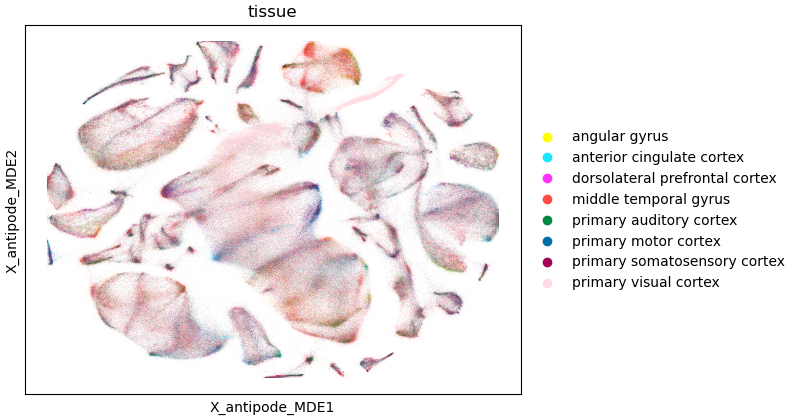

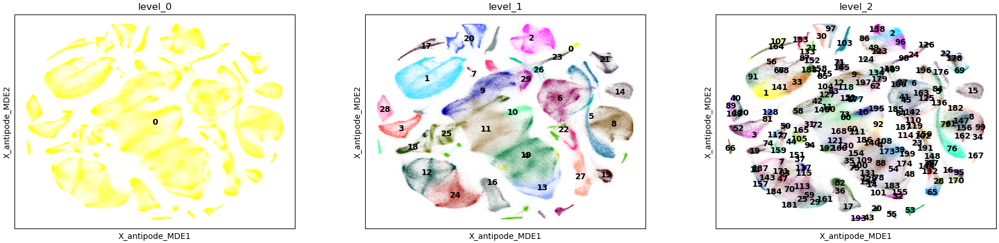

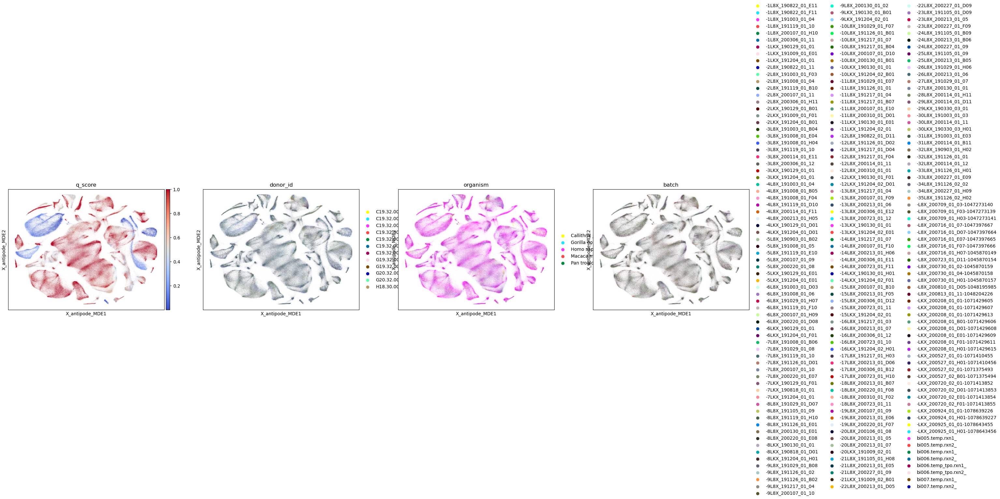

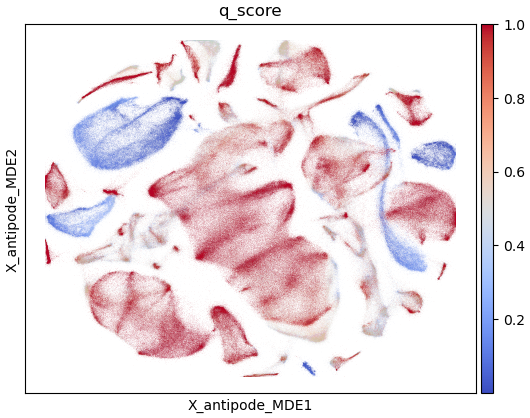

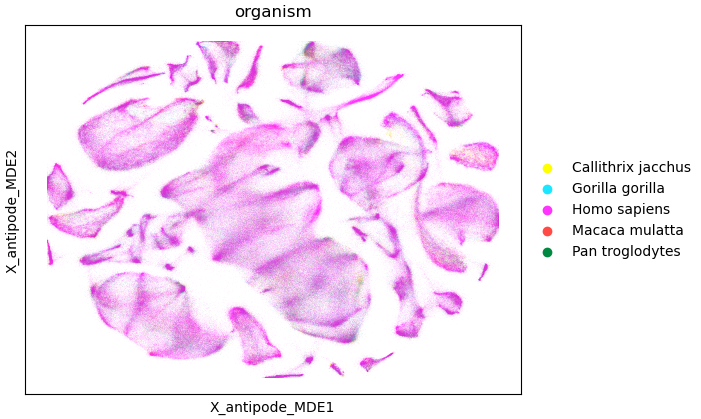

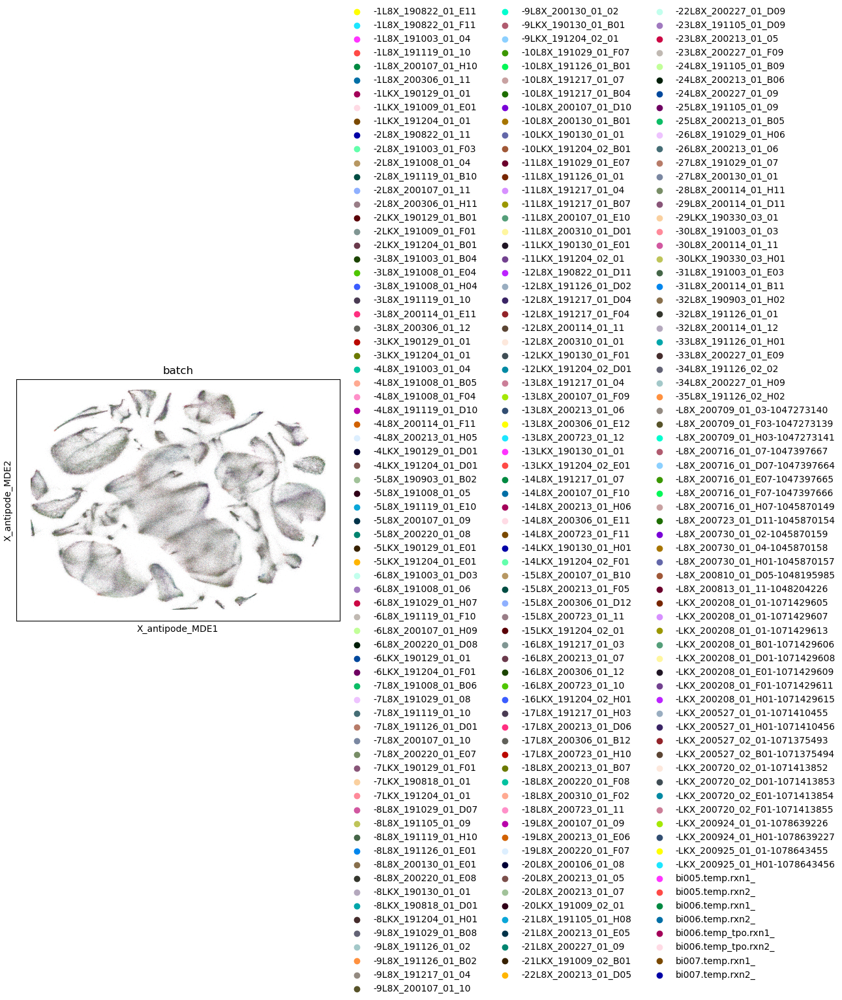

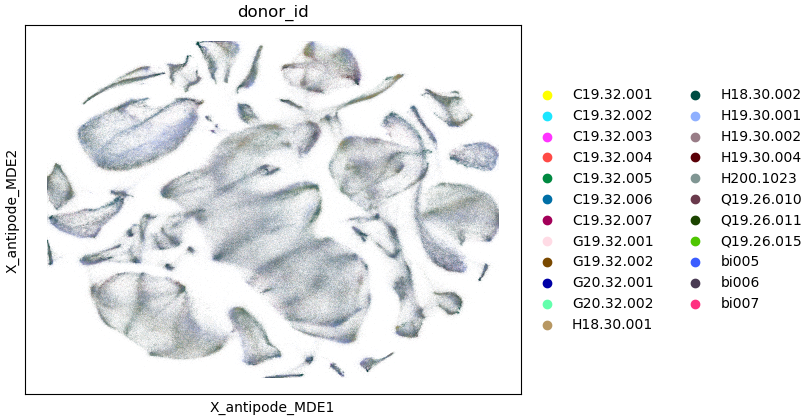

In [5]:
#adata.obsm[MDE_KEY] = clip_latent_dimensions(scvi.model.utils.mde(adata.obsm['X_antipode'],init='random'),0.01)
sc.pl.embedding(
    adata,
    basis=MDE_KEY,palette=sc.pl.palettes.godsnot_102,
    color=['tissue'],save='_tissue.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[x for x in adata.obs.columns if 'level' in x],
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_antipode_clusters.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score','donor_id',discov_key,batch_key],palette=sc.pl.palettes.godsnot_102,cmap='coolwarm'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['q_score'],cmap='coolwarm',save='_q_score.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['organism'],save='_organism.svg'
)

sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=[batch_key],palette=sc.pl.palettes.godsnot_102,save='_batch_name.svg'
)


sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=['donor_id'],palette=sc.pl.palettes.godsnot_102,save='_donor_id.svg'
)



In [6]:
adata.obs

,nCount_RNA,nFeature_RNA,assay_ontology_term_id,cell_type_ontology_term_id,development_stage_ontology_term_id,disease_ontology_term_id,self_reported_ethnicity_ontology_term_id,organism_ontology_term_id,sex_ontology_term_id,suspension_type,...,_scvi_discov_ind,_scvi_batch_ind,psi_0,psi_1,psi_2,q_score,level_0,level_1,level_2,antipode_cluster
bi005.temp.rxn1_CACTAAGAGAGCTTTC,53342,9582,EFO:0009922,CL:1001602,UBERON:0018241,PATO:0000461,na,NCBITaxon:9483,PATO:0000384,nucleus,...,0,206,-0.001282,-0.025217,0.026317,0.997698,0,28,85,0_28_85
bi005.temp.rxn1_GGATCTAGTCCATAGT,45212,8878,EFO:0009922,CL:0002605,UBERON:0018241,PATO:0000461,na,NCBITaxon:9483,PATO:0000384,nucleus,...,0,206,-0.001544,-0.124064,-0.062467,0.998686,0,5,176,0_5_176
bi005.temp.rxn1_CCTCAGTTCCTTATGT,44806,8157,EFO:0009922,CL:0002605,UBERON:0018241,PATO:0000461,na,NCBITaxon:9483,PATO:0000384,nucleus,...,0,206,-0.002481,-0.116511,-0.068476,0.997634,0,5,176,0_5_176
bi005.temp.rxn1_CTCAGGGCAGCTTCCT,41711,8580,EFO:0009922,CL:0002605,UBERON:0018241,PATO:0000461,na,NCBITaxon:9483,PATO:0000384,nucleus,...,0,206,-0.002002,-0.099631,-0.038865,0.997796,0,5,176,0_5_176
bi005.temp.rxn1_TGTAAGCTCGGCCAAC,37667,8030,EFO:0009922,CL:1001602,UBERON:0018241,PATO:0000461,na,NCBITaxon:9483,PATO:0000384,nucleus,...,0,206,-0.003867,0.041047,-0.001230,0.410456,0,14,55,0_14_55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AGCTCAAAGAGAGTGA-18L8TX_200310_01_F02,37263,7799,EFO:0009922,CL:4023017,HsapDv:0000137,PATO:0000461,unknown,NCBITaxon:9606,PATO:0000383,nucleus,...,2,129,-0.002813,-0.026133,0.021870,0.996549,0,24,158,0_24_158
CTACTATTCATGTCTT-18L8TX_200310_01_F02,37097,7064,EFO:0009922,CL:4023017,HsapDv:0000137,PATO:0000461,unknown,NCBITaxon:9606,PATO:0000383,nucleus,...,2,129,-0.003156,-0.017876,0.016774,0.994490,0,24,158,0_24_158
CTCTCGAAGTAGCAAT-18L8TX_200310_01_F02,9987,3974,EFO:0009922,CL:4023017,HsapDv:0000137,PATO:0000461,unknown,NCBITaxon:9606,PATO:0000383,nucleus,...,2,129,-0.003767,-0.016194,0.013049,0.476610,0,24,158,0_24_158
GTGACGCGTTATTCTC-18L8TX_200310_01_F02,5575,2768,EFO:0009922,CL:4023017,HsapDv:0000137,PATO:0000461,unknown,NCBITaxon:9606,PATO:0000383,nucleus,...,2,129,-0.003503,-0.021756,0.017123,0.304198,0,24,158,0_24_158


In [8]:
obss=[]
import h5py
ca_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/cortex_data/jorstad_cross_areal/'
files=os.listdir(ca_path)
for file in files:
    if 'h5ad' in file:
        with h5py.File(os.path.join(ca_path,file), "r") as f:
            obss.append(anndata.experimental.read_elem(f["obs"]))

cs_path='/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/cortex_data/jorstad_cross_species/'
files=os.listdir(cs_path)
for file in files:
    if 'h5ad' in file:
        with h5py.File(os.path.join(cs_path,file), "r") as f:
            obss.append(anndata.experimental.read_elem(f["obs"]))

In [9]:
new_obs=pd.concat(obss,axis=0)

In [10]:
new_obs=new_obs.loc[~new_obs.index.duplicated(),:]

In [11]:
adata.obs_names_make_unique()

In [12]:
#adata=adata[adata.obs.index[~adata.obs.index.duplicated()],:]

In [14]:
js_cols=['Cluster','Neighborhood','Subclass','CrossSpeciesCluster','Class','CrossArea_subclass','CrossArea_cluster','WithinArea_subclass','WithinArea_cluster']
adata.obs.loc[:,js_cols]=new_obs.loc[:,js_cols]

In [15]:
adata.obs['Subclass'] = adata.obs['Subclass'].astype(str)
adata.obs['CrossArea_subclass'] = adata.obs['CrossArea_subclass'].astype(str)
adata.obs.loc[adata.obs['Subclass'].isna() | (adata.obs['Subclass']=='nan'),'Subclass'] = adata.obs.loc[adata.obs['Subclass'].isna() | (adata.obs['Subclass']=='nan'),'CrossArea_subclass']
adata.obs['organism'].astype(str)+adata.obs['Subclass'].astype(str)
adata.strings_to_categoricals()

bi005.temp.rxn1_CACTAAGAGAGCTTTC          Callithrix jacchusEndo
bi005.temp.rxn1_GGATCTAGTCCATAGT         Callithrix jacchusAstro
bi005.temp.rxn1_CCTCAGTTCCTTATGT         Callithrix jacchusAstro
bi005.temp.rxn1_CTCAGGGCAGCTTCCT         Callithrix jacchusAstro
bi005.temp.rxn1_TGTAAGCTCGGCCAAC          Callithrix jacchusEndo
                                                  ...           
AGCTCAAAGAGAGTGA-18L8TX_200310_01_F02      Homo sapiensSst Chodl
CTACTATTCATGTCTT-18L8TX_200310_01_F02      Homo sapiensSst Chodl
CTCTCGAAGTAGCAAT-18L8TX_200310_01_F02      Homo sapiensSst Chodl
GTGACGCGTTATTCTC-18L8TX_200310_01_F02      Homo sapiensSst Chodl
TTACGCCCATTCACCC-18L8TX_200310_01_F02      Homo sapiensSst Chodl
Length: 1667831, dtype: object

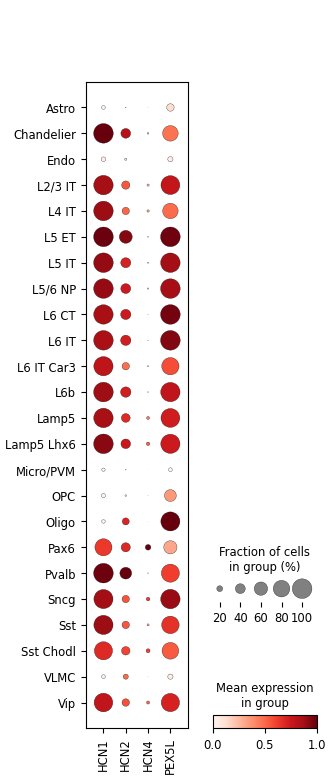

In [29]:
sc.pl.dotplot(adata, groupby='CrossArea_subclass',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var')

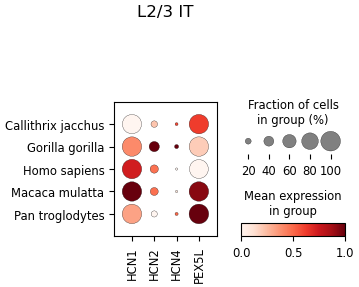

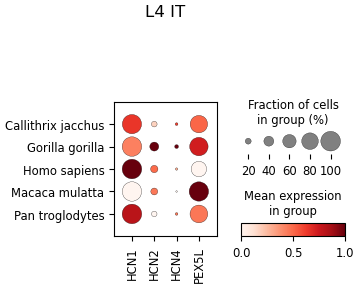

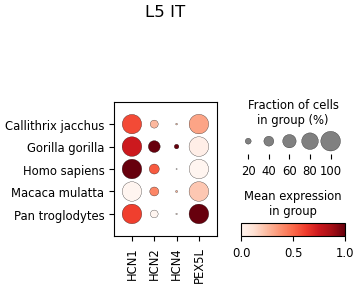

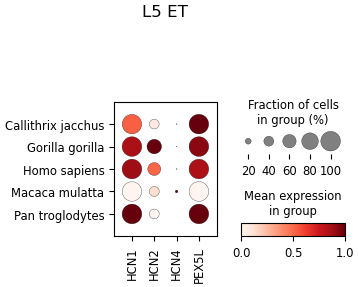

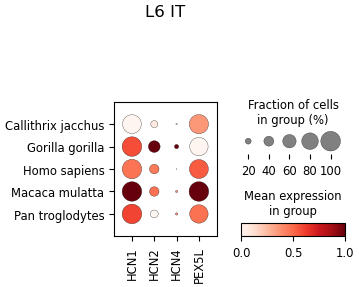

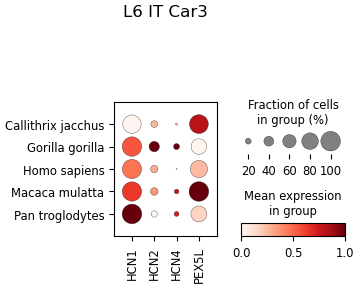

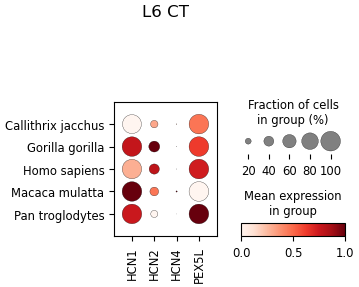

In [20]:
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L2',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L2/3 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L4 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L4 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L5 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L5 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L5 ET',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L5 ET')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L6 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 IT Car3',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L6 IT Car3')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 CT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var',title='L6 CT')

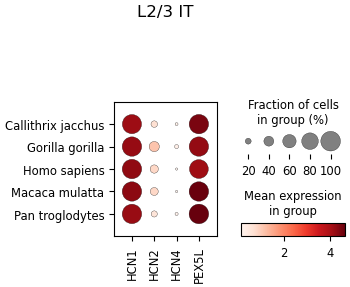

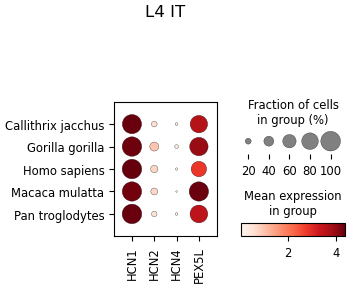

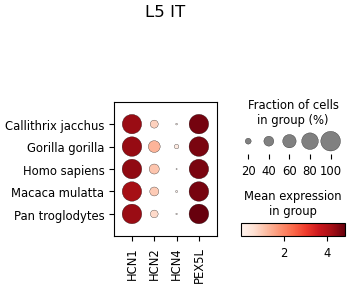

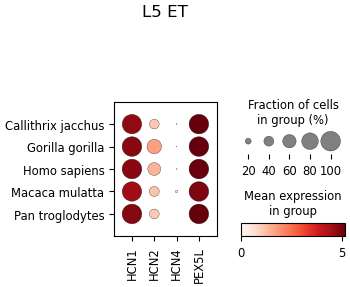

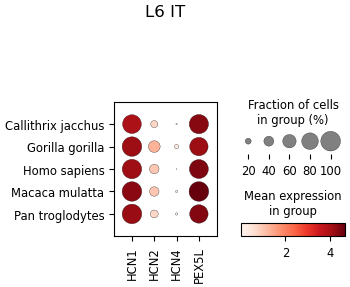

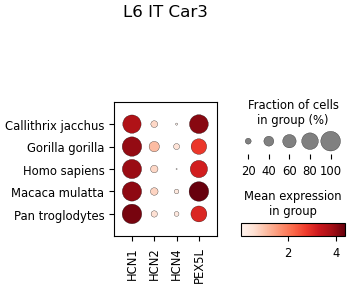

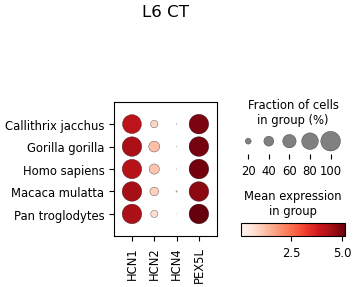

In [21]:
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L2',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L2/3 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L4 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L4 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L5 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L5 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L5 ET',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L5 ET')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 IT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L6 IT')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 IT Car3',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L6 IT Car3')
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L6 CT',regex=True),:], groupby='organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='',title='L6 CT')

In [69]:
adata.obs['subclass_organism'] = adata.obs['Subclass'].astype(str) + '_' + adata.obs['organism'].astype(str)

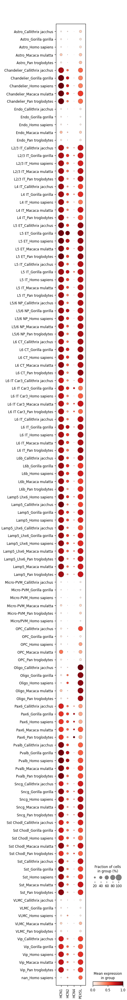

In [70]:
sc.pl.dotplot(adata, groupby='subclass_organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var')


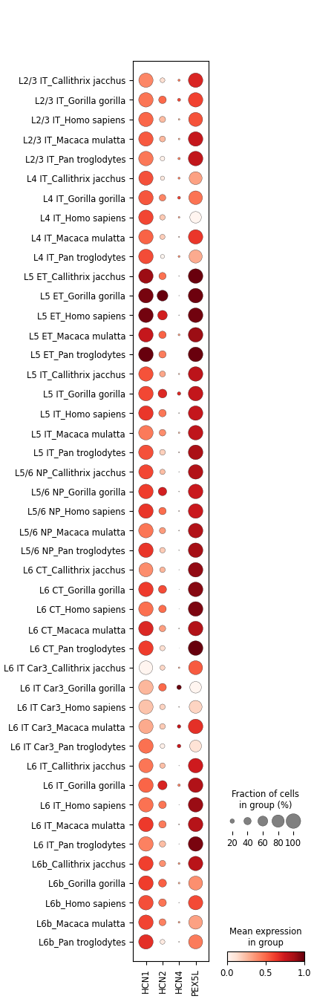

In [72]:
sc.pl.dotplot(adata[adata.obs['Subclass'].astype(str).str.contains('^L[1-9]+',regex=True),:], groupby='subclass_organism',var_names=['HCN1','HCN2','HCN4','PEX5L'],use_raw=False,standard_scale='var')


In [18]:
#adata=adata.to_memory()

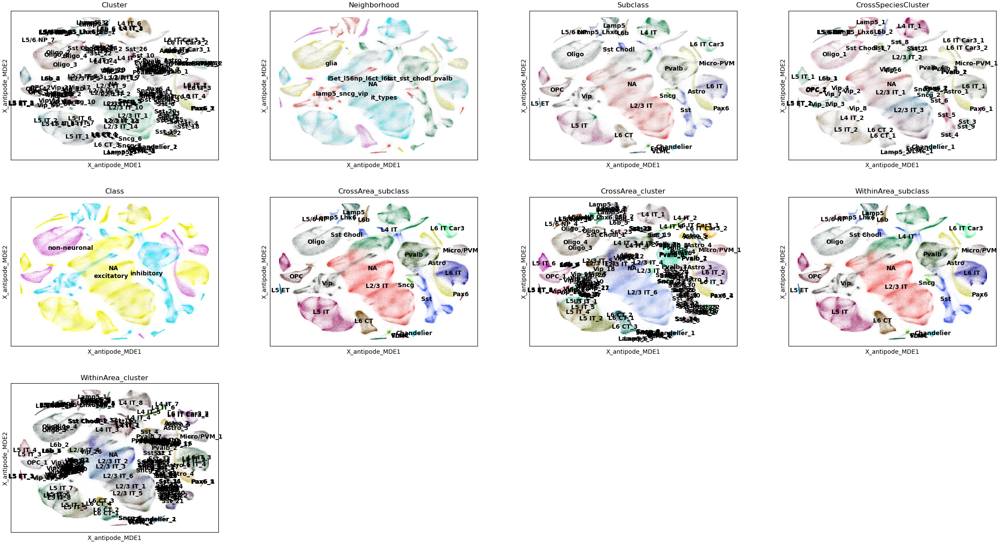

In [19]:
sc.pl.embedding(
    adata,
    basis=MDE_KEY,
    color=js_cols,
    palette=sc.pl.palettes.godsnot_102,
    legend_loc='on data',save='_jorstad_clusters.svg'
)


In [14]:
spec_mat=adata.obs.groupby('level_2')['organism'].value_counts().unstack()
spec_mat=spec_mat/spec_mat.sum(0)

/scratch/fast/16080181/ipykernel_24310/3462373812.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  spec_mat=adata.obs.groupby('level_2')['organism'].value_counts().unstack()


In [15]:
area_level=adata.obs.groupby('level_2')['tissue'].value_counts().unstack()
area_level=area_level/area_level.sum(0)
area_level=(area_level.T/area_level.sum(1)).T

/scratch/fast/16080181/ipykernel_24310/199645314.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_level=adata.obs.groupby('level_2')['tissue'].value_counts().unstack()


In [16]:
#spec_mat.loc[:,area_level.columns]=area_level

In [17]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.sans-serif']='DejaVuSansMono'
plt.rcParams['pdf.fonttype']=42


/scratch/fast/16080181/ipykernel_24310/3560633668.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs1]=df[obs1].astype('category')
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 46.56805555555555 mm


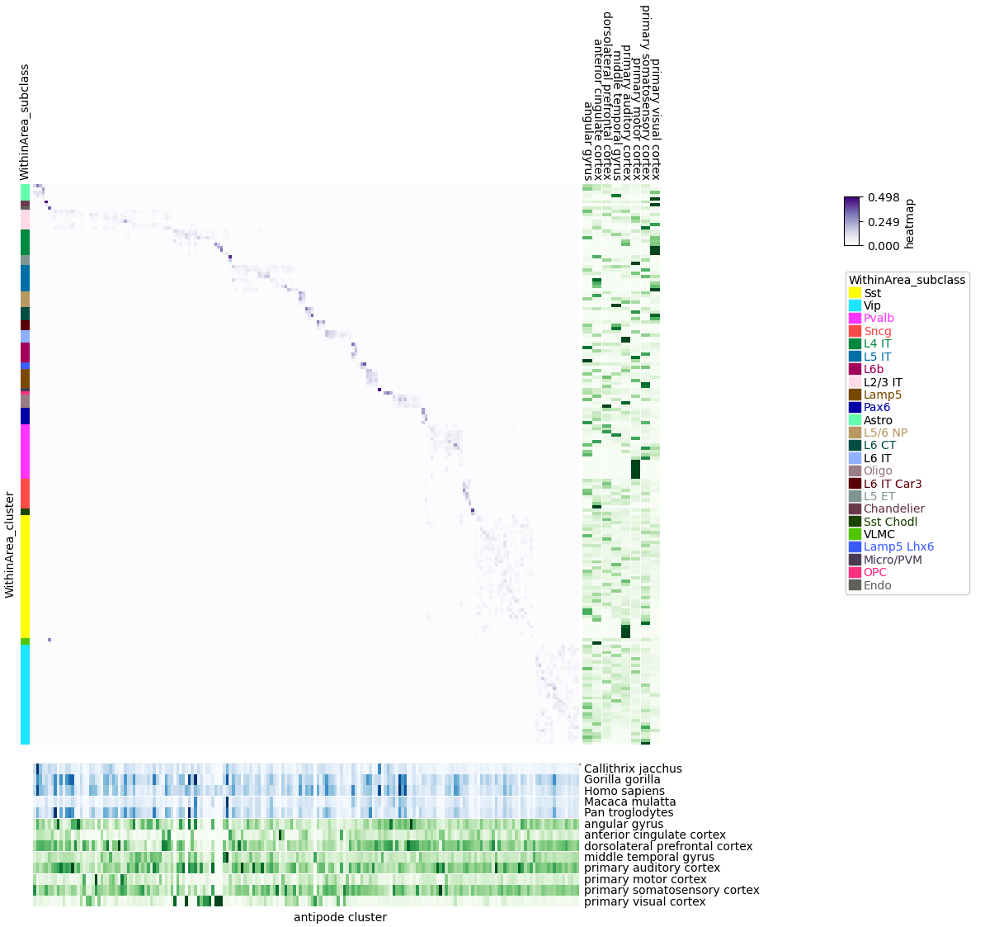

/scratch/fast/16080181/ipykernel_24310/3560633668.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs1]=df[obs1].astype('category')
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 44.275 mm


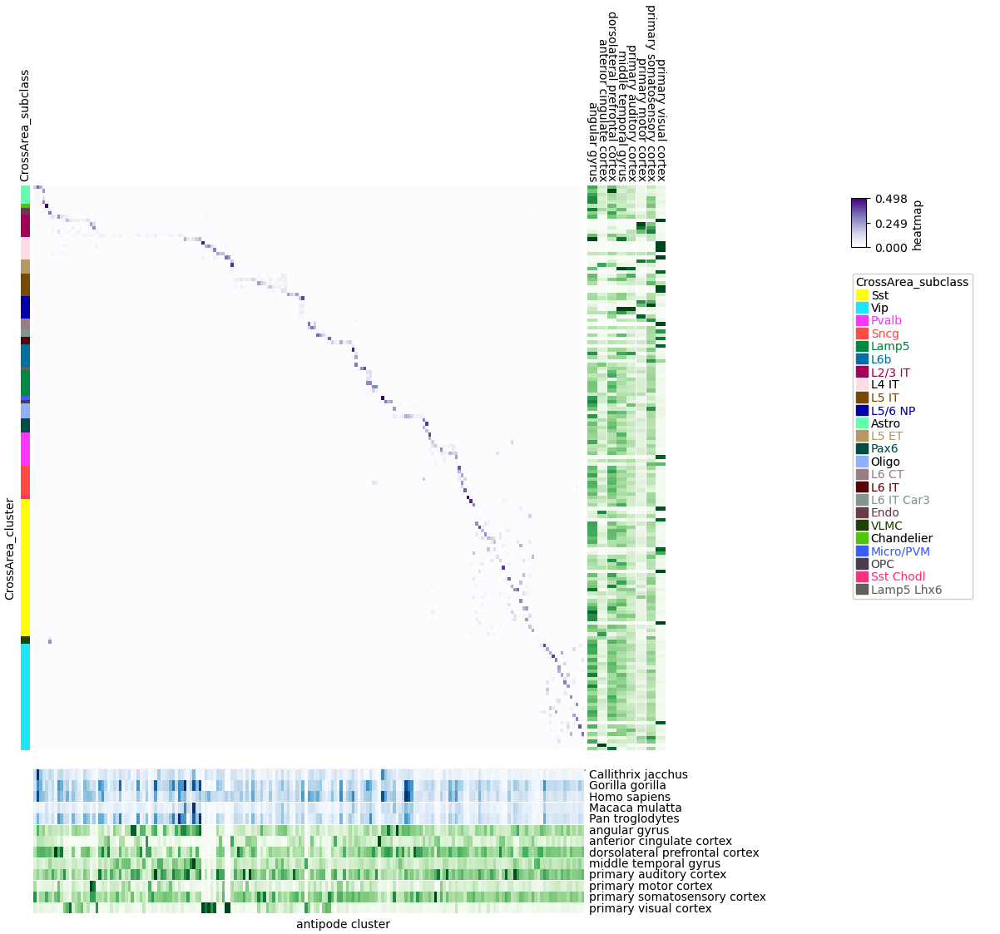

In [18]:


for js_area in ['WithinArea','CrossArea']:
    area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
    area_mat=area_mat/area_mat.sum(0)
    area_mat=(area_mat.T/area_mat.sum(1)).T
    
    jmat=sc_analysis.get_cross_category_jaccard(adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:],js_area+'_cluster','level_2')
    #jmat=jmat.loc[(area_mat.max(1)>0.5),:]
    jmat.columns=jmat.columns.astype('string')
    jmat.index=jmat.index.astype('string')
    l2l1d=adata.obs.groupby('level_2')['level_1'].value_counts().unstack().idxmax(1).to_dict()
    wawcd=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')[js_area+'_subclass'].value_counts().unstack().idxmax(1).to_dict()
    
    left_df=pd.DataFrame(jmat.index.astype('string'),index=jmat.index,columns=['name'])
    left_df[js_area+'_subclass'] = left_df['name'].replace(wawcd).astype('string')
    left_df['label']=left_df.index
    left_df.loc[:,area_mat.columns]=area_mat
    
    bottom_df=pd.DataFrame(jmat.columns.astype('string'),index=jmat.columns,columns=['name'])
    bottom_df['subclass'] = bottom_df['name'].replace(l2l1d).astype('string')
    bottom_df['label']=bottom_df.index
    bottom_df.loc[:,spec_mat.columns]=spec_mat
    bottom_df.loc[:,area_level.columns]=area_level
    
    left_dict={}
    left_dict[js_area+'_subclass']=pch.anno_simple(left_df[js_area+'_subclass'],cmap='godsnot_102',legend=True,rasterized=False)
    #left_dict['label']=pch.anno_label(left_df['label'], merge=True,adjust_color=False,colors='black',extend=True,relpos=[0.,0.],fontsize=8,arrowprops = dict(visible=False),rasterized=False)
    
    right_dict={}
    for a in area_mat.columns:
        right_dict[a]=pch.anno_simple(left_df[a],cmap='Greens',legend=False,rasterized=False)
    
    
    bottom_dict={}
    #bottom_dict['subclass']=pch.anno_simple(bottom_df['subclass'],cmap='godsnot_102',legend=False,rasterized=False)
    bottom_dict['label']=pch.anno_label(bottom_df['label'], merge=True, rotation=-45,adjust_color=False,colors='black',extend=True,relpos=[0.,-10.],fontsize=2,arrowprops = dict(visible=False),rasterized=False)
    for s in spec_mat.columns:
        bottom_dict[s]=pch.anno_simple(bottom_df[s],cmap='Blues',legend=False,rasterized=False)
    
    for a in area_level.columns:
        bottom_dict[a]=pch.anno_simple(bottom_df[a],cmap='Greens',legend=False,rasterized=False)

    
    
    bottom_anno = pch.HeatmapAnnotation(**bottom_dict,axis=1,orientation='down')
    left_anno = pch.HeatmapAnnotation(**left_dict,axis=0,orientation='left')
    right_anno = pch.HeatmapAnnotation(**right_dict,axis=0,orientation='right')

    plt.figure(figsize=(10,10))
    cm1 = pch.ClusterMapPlotter(data=jmat,cmap='Purples',row_cluster=False,col_cluster=False,left_annotation=left_anno,bottom_annotation=bottom_anno,right_annotation=right_anno,
                                xlabel='antipode cluster',ylabel=js_area+'_cluster')
    
    plt.savefig(os.path.join(sc.settings.figdir,js_area+'_jorstadvsantipode_heatmap.svg'))
    plt.show()

/scratch/fast/16080181/ipykernel_24310/4265403444.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs1]=df[obs1].astype('category')
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 46.56805555555555 mm


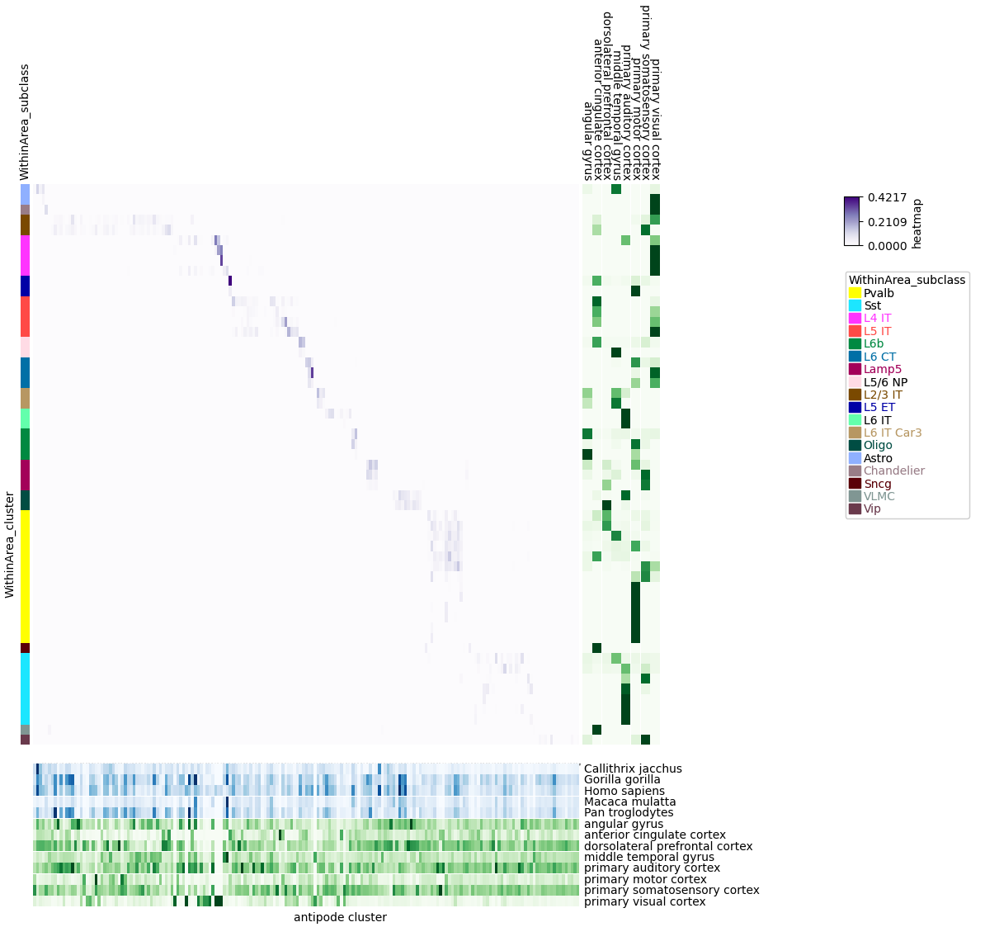

/scratch/fast/16080181/ipykernel_24310/4265403444.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:152: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[obs1]=df[obs1].astype('category')
/home/matthew.schmitz/utils/mts-utils/genomics/sc_analysis.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

Starting plotting..
Starting calculating row orders..
Reordering rows..
Starting calculating col orders..
Reordering cols..
Plotting matrix..
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Starting plotting HeatmapAnnotations
Plotting legends..
Estimated legend width: 44.275 mm


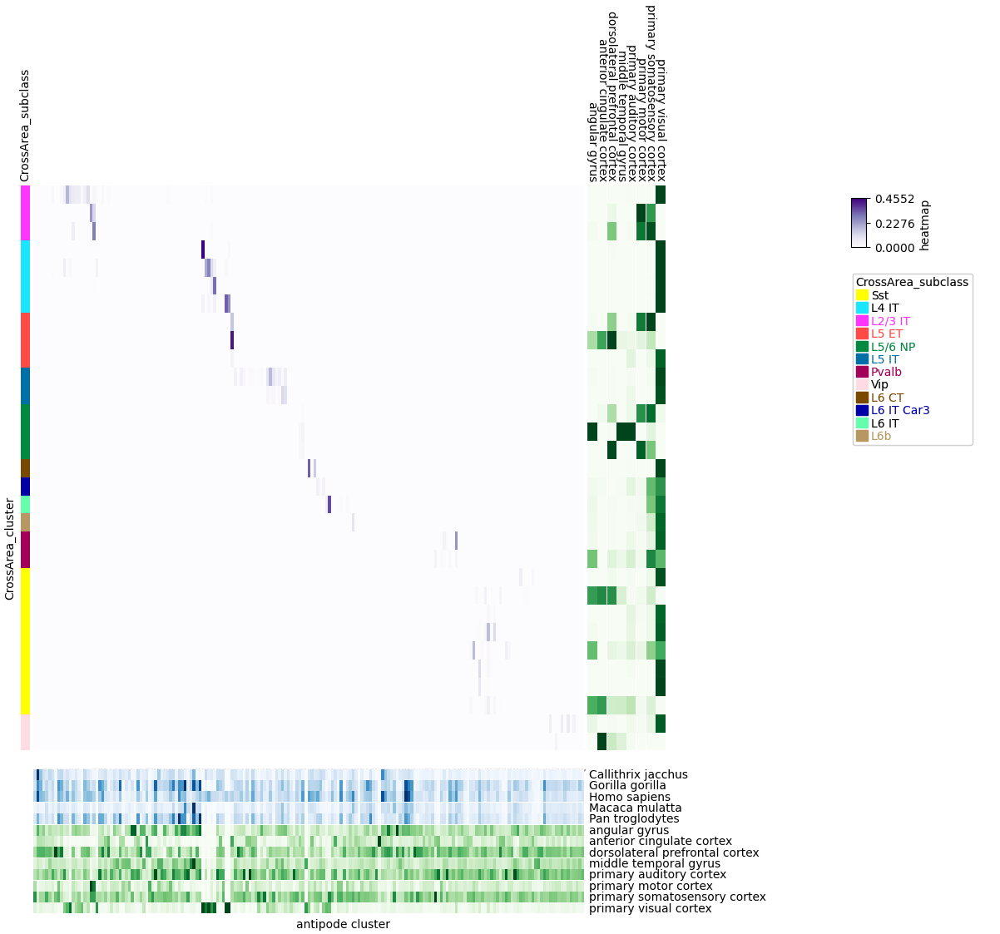

In [19]:
for js_area in ['WithinArea','CrossArea']:
    area_mat=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')['tissue'].value_counts().unstack()
    area_mat=area_mat/area_mat.sum(0)
    area_mat=(area_mat.T/area_mat.sum(1)).T
    
    jmat=sc_analysis.get_cross_category_jaccard(adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:],js_area+'_cluster','level_2')
    jmat=jmat.loc[(area_mat.max(1)>0.5),:]
    jmat.columns=jmat.columns.astype('string')
    jmat.index=jmat.index.astype('string')
    l2l1d=adata.obs.groupby('level_2')['level_1'].value_counts().unstack().idxmax(1).to_dict()
    wawcd=adata.obs.loc[~adata.obs[js_area+'_cluster'].isna(),:].groupby(js_area+'_cluster')[js_area+'_subclass'].value_counts().unstack().idxmax(1).to_dict()
    
    left_df=pd.DataFrame(jmat.index.astype('string'),index=jmat.index,columns=['name'])
    left_df[js_area+'_subclass'] = left_df['name'].replace(wawcd).astype('string')
    left_df['label']=left_df.index
    left_df.loc[:,area_mat.columns]=area_mat
    
    bottom_df=pd.DataFrame(jmat.columns.astype('string'),index=jmat.columns,columns=['name'])
    bottom_df['subclass'] = bottom_df['name'].replace(l2l1d).astype('string')
    bottom_df['label']=bottom_df.index
    bottom_df.loc[:,spec_mat.columns]=spec_mat
    bottom_df.loc[:,area_level.columns]=area_level
    
    left_dict={}
    left_dict[js_area+'_subclass']=pch.anno_simple(left_df[js_area+'_subclass'],cmap='godsnot_102',legend=True,rasterized=False)
    #left_dict['label']=pch.anno_label(left_df['label'], merge=True,adjust_color=False,colors='black',extend=True,relpos=[0.,0.],fontsize=8,arrowprops = dict(visible=False),rasterized=False)
    
    right_dict={}
    for a in area_mat.columns:
        right_dict[a]=pch.anno_simple(left_df[a],cmap='Greens',legend=False,rasterized=False)
    
    
    bottom_dict={}
    #bottom_dict['subclass']=pch.anno_simple(bottom_df['subclass'],cmap='godsnot_102',legend=False,rasterized=False)
    bottom_dict['label']=pch.anno_label(bottom_df['label'], merge=True, rotation=-45,adjust_color=False,colors='black',extend=True,relpos=[0.,-10.],fontsize=2,arrowprops = dict(visible=False),rasterized=False)
    for s in spec_mat.columns:
        bottom_dict[s]=pch.anno_simple(bottom_df[s],cmap='Blues',legend=False,rasterized=False)
    
    for a in area_level.columns:
        bottom_dict[a]=pch.anno_simple(bottom_df[a],cmap='Greens',legend=False,rasterized=False)

    
    
    bottom_anno = pch.HeatmapAnnotation(**bottom_dict,axis=1,orientation='down')
    left_anno = pch.HeatmapAnnotation(**left_dict,axis=0,orientation='left')
    right_anno = pch.HeatmapAnnotation(**right_dict,axis=0,orientation='right')
    plt.figure(figsize=(10,10))
    cm1 = pch.ClusterMapPlotter(data=jmat,cmap='Purples',row_cluster=False,col_cluster=False,left_annotation=left_anno,bottom_annotation=bottom_anno,right_annotation=right_anno,
                                xlabel='antipode cluster',ylabel=js_area+'_cluster')
    
    plt.savefig(os.path.join(sc.settings.figdir,js_area+'_jorstadvsantipode_specificonly_heatmap.svg'))
    plt.show()

In [ ]:
#adata=adata.to_memory()

In [ ]:
adata.layers['UMIs']=scipy.sparse.csr_matrix(1e4*(adata.layers['UMIs']/adata.layers['UMIs'].sum(1)))

In [ ]:
sc.tl.dendrogram(adata,groupby='level_2',use_rep='X_antipode')

In [ ]:
pstore=adata.uns['param_store']
n_clusters=antipode_model.level_sizes[-1]

In [ ]:
prefix=''
level_edges=[numpy_hardmax(antipode_model.adata_manager.adata.uns[prefix+'param_store']['edges_'+str(i)],axis=-1) for i in range(len(antipode_model.level_sizes)-1)]
levels=antipode_model.tree_convergence_bottom_up.just_propagate(np.eye(antipode_model.level_sizes[-1]),level_edges)
prop_taxon=np.concatenate(levels,axis=-1)

In [ ]:
discov_labels=adata.obs[antipode_model.discov_key].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
cluster_index=sorted(adata.obs['level_2'].astype(int).unique())#list(range(antipode_model.level_sizes[-1]))#list(range(pstore['locs'].shape[0]))
cluster_labels=[str(x) for x in cluster_index]#adapt
cluster_label_dict=dict(zip(cluster_index,cluster_labels))
var_labels=adata.var.index

In [ ]:
prop_locs=prop_taxon@pstore['locs']
prop_cluster_intercept=prop_taxon@pstore['cluster_intercept']
cluster_params=(prop_locs@pstore['z_decoder_weight'])+prop_cluster_intercept
cluster_params=cluster_params[cluster_index,:]

In [ ]:
#Need to propagate multilayer tree to discovs
prop_discov_di = np.einsum('pc,dcg->dpg',prop_taxon,pstore['discov_di'])
prop_discov_dm = np.einsum('pc,dcm->dpm',prop_taxon,pstore['discov_dm'])
discov_cluster_params=np.einsum('dpm,dmg->dpg',prop_locs+prop_discov_dm,pstore['z_decoder_weight']+pstore['discov_dc'])+(prop_cluster_intercept+prop_discov_di+np.expand_dims(pstore['discov_constitutive_de'],1))

In [ ]:
aggr_means=antipode.model_functions.group_aggr_anndata(adata,['species','level_2'],layer='UMIs')
log_real_means=np.log(aggr_means[0]+1e-3)

In [ ]:
seaborn.histplot(log_real_means.flatten())

In [ ]:
centered_discov_cluster_params=discov_cluster_params[:,cluster_index,:]-discov_cluster_params[:,cluster_index,:].mean(0)

In [ ]:
pstore.keys()

In [ ]:
centered_aggr_means=log_real_means-log_real_means.mean(0)

In [ ]:
log_real_means.shape

In [ ]:
seaborn.scatterplot(x=log_real_means.mean(0).mean(0),y=pstore['s_inverse_dispersion'],s=0.2)

In [ ]:
randinds=np.random.choice(np.array(list(range(centered_aggr_means.flatten().shape[0]))),size=100000,replace=False)
with seaborn.axes_style("whitegrid"):
    seaborn.scatterplot(x=centered_discov_cluster_params.flatten()[randinds],y=centered_aggr_means.flatten()[randinds],s=0.2,color='black')
    seaborn.kdeplot(x=centered_aggr_means.flatten()[randinds],y=centered_discov_cluster_params.flatten()[randinds],linestyles='--', linewidths=0.5)
    plt.xlabel('reconstructed log mean cluster species LFC')
    plt.ylabel('actual mean cluster species LFC')

# Calculate the regression parameters
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(centered_discov_cluster_params.flatten(),centered_aggr_means.flatten())

# Plot the regression line
x_values = np.linspace(np.min(centered_discov_cluster_params.flatten()[randinds]), np.max(centered_discov_cluster_params.flatten()[randinds]), 100)
plt.plot(x_values, slope * x_values + intercept, color='red', label=f'y={slope:.2f}x+{intercept:.2f}, R²={r_value**2:.2f}')

# Add legend
plt.legend()


In [ ]:
randinds=np.random.choice(np.array(list(range(log_real_means.mean(0).flatten().shape[0]))),size=100000,replace=False)
seaborn.scatterplot(x=cluster_params.flatten()[randinds],y=log_real_means.mean(0).flatten()[randinds],s=0.2,color='black')
seaborn.kdeplot(x=cluster_params.flatten()[randinds],y=log_real_means.mean(0).flatten()[randinds],linestyles='--', linewidths=0.5)
plt.xlabel('reconstructed log mean cluster exp')
plt.ylabel('actual mean cluster exp (counts/1e4)')

In [ ]:
def melt_param_3d(X,discov_labels,cluster_labels,var_labels):
    dfs=[]
    for i in range(len(discov_labels)):
        for j in range(len(cluster_labels)):
            df=pd.DataFrame(X[i,j,:],columns=['value'])
            df['discov']=discov_labels[i]
            df['cluster']=cluster_labels[j]
            df['var']=var_labels
            dfs.append(df)
    return(pd.concat(dfs,axis=0))

In [ ]:
melted_reconstruction=melt_param_3d(discov_cluster_params,discov_labels,cluster_labels,var_labels)
seaborn.histplot(data=melted_reconstruction,x='value',hue='discov')
plt.title('Reconstructed Expression')
plt.show()
seaborn.ecdfplot(data=melted_reconstruction,x='value',hue='discov')
plt.title('Reconstructed Expression ECDF')
plt.show()

In [ ]:
melted_reconstruction_fc=melt_param_3d(centered_discov_cluster_params,discov_labels,cluster_labels,var_labels)
seaborn.histplot(data=melted_reconstruction_fc,x='value',hue='discov')
plt.title('Reconstructed DE LFC')
plt.show()
seaborn.ecdfplot(data=melted_reconstruction_fc,x='value',hue='discov')
plt.title('Reconstructed DE LFC ECDF')
plt.show()

In [ ]:
melted_mean_fcs=melt_param_3d(centered_aggr_means,discov_labels,cluster_labels,var_labels)
seaborn.histplot(data=melted_mean_fcs,x='value',hue='discov')
plt.title('Actual DE LFC')
plt.show()
seaborn.ecdfplot(data=melted_mean_fcs,x='value',hue='discov')
plt.title('Actual DE LFC ECDF')
plt.show()

In [ ]:
melted_means=melt_param_3d(log_real_means,discov_labels,cluster_labels,var_labels)
seaborn.histplot(data=melted_means,x='value',hue='discov')
plt.title('Actual Expression')
plt.show()
seaborn.ecdfplot(data=melted_means,x='value',hue='discov')
plt.title('Actual Expression ECDF')
plt.show()